# Домашнее задание 3. Детекция объектов

## Описание

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

### Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом, и точно не будет работать из коробки на Windows.

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

### Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [28]:
# Harry Potter
! rm -rf harry/
! rm -rf harry.zip

! wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip -O harry.zip
! unzip -q harry.zip -d harry

! mv harry/data/* harry/
! rmdir harry/data

DATASET_NAME = 'harry'
N_EPOCHS = 20

'rm' is not recognized as an internal or external command,
operable program or batch file.
'rm' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'unzip' is not recognized as an internal or external command,
operable program or batch file.
'mv' is not recognized as an internal or external command,
operable program or batch file.
Invalid switch - "data".


### Зависимости

In [29]:
import os
import glob
import json
import shutil
import random
import typing
import pathlib
import functools

import xml
import PIL
import tqdm
import numpy
import torch
import wandb
import matplotlib
import torchvision
import albumentations
import matplotlib.pyplot as plt
import albumentations.pytorch.transforms as transforms

device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available()
    else "cpu"
)
print(device)

RANDOM_STATE = 42
def set_random_seed(seed: int) -> None:
    random.seed(seed)
    numpy.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True
def fix_random() -> None:
    return set_random_seed(RANDOM_STATE)
fix_random()

cuda


In [30]:
wandb.login(anonymous = "allow")

True

## Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

In [31]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, root: pathlib.Path, train: bool, transform: albumentations.Compose):
        self.root = root
        self.train = train
        self.transform = transform
        assert self.root.is_dir(), f"No data at `{root}`"

        filepaths = numpy.array(glob.glob(root.joinpath("images/*").as_posix()))
        with open(root.joinpath("class_dict"), "r") as f: self.class_to_idx = json.load(f)
        self.idx_to_class = { v: k for k, v in self.class_to_idx.items() }

        fix_random()
        split = int(len(filepaths) * 0.9)
        permutation = numpy.random.permutation(len(filepaths))
        indexes = permutation[:split] if train else permutation[split:]
        self.images = [ pathlib.Path(filepath) for filepath in filepaths[indexes] ]

    def get_image(self, idx: int) -> numpy.ndarray[int]:
        return numpy.asarray(PIL.Image.open(self.images[idx]))
    
    def get_bboxes(self, idx: int) -> typing.List[typing.Tuple[int, int, int, int, int]]:
        xml_path = list(self.images[idx].parts)
        xml_path[1] = 'xmls'
        xml_path = pathlib.Path(*xml_path).with_suffix(".xml")

        bboxes = []
        for bbox in xml.etree.ElementTree.parse(xml_path).getroot().findall("object"):
            assert len(bbox.findall("name")) == 1
            assert len(bbox.findall("bndbox")) == 1
            bndbox = bbox.find("bndbox")
            class_name = bbox.find("name").text
            assert class_name in self.class_to_idx

            assert len(bndbox.findall("xmin")) == 1
            assert len(bndbox.findall("ymin")) == 1
            assert len(bndbox.findall("xmax")) == 1
            assert len(bndbox.findall("ymax")) == 1

            bboxes.append((
                int(bndbox.find("xmin").text), int(bndbox.find("ymin").text),
                int(bndbox.find("xmax").text), int(bndbox.find("ymax").text),
                self.class_to_idx[class_name]
            ))

        return bboxes
        
    def __getitem__(self, idx: int) -> typing.Tuple[torch.Tensor, typing.List[typing.Tuple[int, int, int, int, int]]]:
        data = self.transform(image = self.get_image(idx), bboxes = self.get_bboxes(idx))
        return data['image'], data['bboxes']

    def __len__(self) -> int:
        return len(self.images)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [32]:
mean = numpy.array([ 0.485, 0.456, 0.406 ])
std = numpy.array([ 0.229, 0.224, 0.225 ])

transforms = [
    albumentations.Resize(512, 512),
    albumentations.augmentations.transforms.Normalize(mean = mean, std = std),
    albumentations.pytorch.transforms.ToTensorV2(),
]

train_transform = albumentations.Compose(transforms, bbox_params = dict(format = "pascal_voc", min_visibility = 0.3))
test_transform = albumentations.Compose(transforms, bbox_params = dict(format = "pascal_voc", min_visibility = 0.5))

train_set = PascalDataset(pathlib.Path(DATASET_NAME), True, train_transform)
test_set = PascalDataset(pathlib.Path(DATASET_NAME), False, test_transform)

## Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

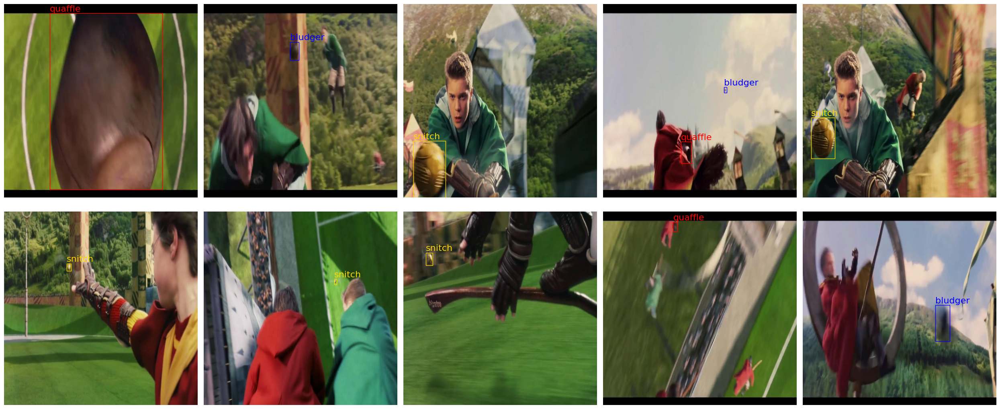

In [33]:
def get_class_color(class_name: str) -> str:
    match class_name:
        # Harry potter dataset
        case 'snitch': return 'gold'
        case 'quaffle': return 'red'
        case 'bludger': return 'blue'

        # Cards dataset
        case 'king': return 'red'
        case 'jack': return 'blue'
        case 'ace': return 'black'
        case 'ten': return 'green'
        case 'nine': return 'white'
        case 'queen': return 'pink'

        # Default
        case _: raise NotImplementedError
    
def visualize(data: typing.List[typing.Tuple[torch.Tensor, typing.List[typing.Tuple[int, int, int, int, int]]]]) -> None:
    denormalize = albumentations.Compose([
        albumentations.augmentations.transforms.Normalize(mean = [ 0., 0., 0. ], std = 1 / std, max_pixel_value = 1),
        albumentations.augmentations.transforms.Normalize(mean = -mean, std = [ 1, 1, 1 ], max_pixel_value = 1)
    ])

    fig, axes = matplotlib.pyplot.subplots(2, len(data) // 2 + len(data) % 2, figsize = (25, 11), dpi = 100)
    for i, ax in enumerate(axes.reshape(-1)):
        ax.axis(False)
        if i >= len(data): break
        image, bboxes = data[i]
        ax.imshow(denormalize(image = image.permute(1, 2, 0).numpy())['image'])
        for bbox in bboxes:
            xmin, ymin, xmax, ymax, class_idx = bbox
            class_name = train_set.idx_to_class[class_idx]
            class_color = get_class_color(class_name)
            rect = matplotlib.patches.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                linewidth = 1, edgecolor = class_color, facecolor = 'none'
            )
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, class_name, color = class_color, fontsize = 16)

    fig.tight_layout()

visualize([ train_set[i] for i in range(10) ])

## Задача 3. 3 балла.

### YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

### Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и сгенерировать тензор размера Bx16x16x6. Первая размерность - это количество примеров в батче. Далее идут две пространственные размерности, это сетка 16 на 16. 

В каналах у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "пиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

In [34]:
def collate_fn(
    batch: typing.List[typing.Tuple[torch.Tensor, typing.List[typing.Tuple[int, int, int, int, int]]]],
    downsample: int = 32
) -> typing.Tuple[torch.Tensor, torch.Tensor]:
    images, batch_boxes = zip(*batch)
    images = torch.stack(images)
    b, c, h, w = images.shape

    targets = images.new_zeros(b, 6, h // downsample, w // downsample)
    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(torch.squeeze, torch.split(images.new_tensor(boxes), 1, dim = -1))
        center_x = (xmin + xmax) / 2
        center_y = (ymin + ymax) / 2

        cell_x = (center_x // downsample).int()
        cell_y = (center_y // downsample).int()

        offset_x = (center_x - cell_x * downsample) / downsample
        offset_y = (center_y - cell_y * downsample) / downsample

        width = (xmax - xmin) / w
        height = (ymax - ymin) / h

        confidence = torch.ones_like(offset_x)
        targets[i, :, cell_x, cell_y] = torch.stack([ offset_x, offset_y, width, height, confidence, classes ])

    return images, targets

In [35]:
def test_collate_fn() -> None:
    target1 = [ (100, 200, 200, 300, 2) ]
    target2 = [ (0, 250, 200, 300, 0), (0, 100, 100, 300, 1) ]
    imgs, targets = collate_fn([ (torch.rand((3, 512, 512)), target1), (torch.rand((3, 512, 512)), target2) ])
    assert imgs.shape == (2, 3, 512, 512)
    assert targets.shape == (2, 6, 16, 16)
    assert numpy.allclose(targets[0, :, 4, 7], torch.tensor([ 22 / 32, 26 / 32, 100 / 512, 100 / 512, 1, 2 ]))
    assert numpy.allclose(targets[1, :, 3, 8], torch.tensor([ 4 / 32, 19 / 32, 200 / 512, 50 / 512, 1, 0 ]))
    assert numpy.allclose(targets[1, :, 1, 6], torch.tensor([ 18 / 32, 8 / 32, 100 / 512, 200 / 512, 1, 1 ]))
    targets[0, :, 4, 7] = targets[1, :, 3, 8] = targets[1, :, 1, 6] = torch.zeros(6)
    assert numpy.allclose(targets, 0)
test_collate_fn()

Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

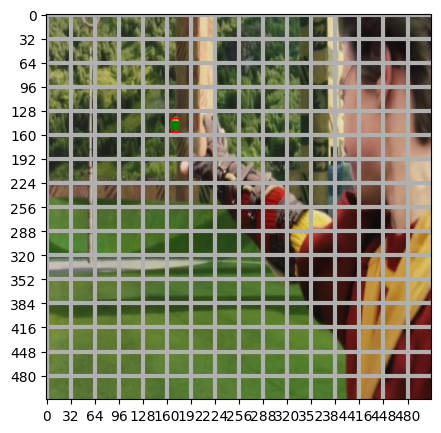

In [36]:
def show(i: int) -> None:
    fig, ax = plt.subplots(figsize = (5, 5))

    img = train_set[i][0].permute(1, 2, 0) * torch.tensor(std).view(1, 1, -1) + torch.tensor(mean).view(1, 1, -1)
    bboxes = torch.tensor(train_set[i][1])

    ax.imshow(img)
    loc = plt.matplotlib.ticker.MultipleLocator(base = 32)
    ax.xaxis.set_major_locator(loc)
    ax.yaxis.set_major_locator(loc)
    ax.grid(which = "major", axis = "both", linestyle = "-", linewidth = 3)

    for bbox in bboxes:
        xmin, ymin, xmax, ymax = bbox[:-1]
        w = xmax - xmin
        h = ymax - ymin
        ax.add_patch(matplotlib.patches.Rectangle((xmin, ymin), w, h, fill = False, color = "red"))

    cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
    cy = (bboxes[:, 1] + bboxes[:, 3]) / 2
    ax.scatter(cx, cy, color = "green", marker = "o")
show(5)

### Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx16x16x6. Почему? 

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами. 

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [37]:
def decode_predictions(
    pred: torch.Tensor,
    upsample: int = 32,
    threshold: float = 0.7
) -> typing.List[typing.Tuple[int, int, int, int, int]]:
    b, c, h, w = pred.shape
    batch_boxes = [ ]
    for i in range(b):
        indices = torch.nonzero(pred[i, 4, :, :] >= threshold)
        cell_x, cell_y = indices.transpose(0, 1)
        boxes = pred[i, :, cell_x, cell_y]

        center_x = (boxes[0, :] + cell_x) * upsample
        width = boxes[2, :] * w * upsample
        xmin = center_x - width / 2
        xmax = center_x + width / 2
        
        center_y = (boxes[1, :] + cell_y) * upsample
        height = boxes[3, :] * h * upsample
        ymin = center_y - height / 2
        ymax = center_y + height / 2
    
        classes = torch.argmax(boxes[5:, :], dim = 0) if boxes.shape[0] != 6 else boxes[5, :]
        boxes = torch.stack([ xmin, ymin, xmax, ymax, classes ]).transpose(0, 1)
        batch_boxes.append(list(map(tuple, boxes.tolist())))
    return batch_boxes

In [38]:
def test_decode_predictions() -> None:
    target1 = [ (100, 200, 200, 300, 2) ]
    target2 = [ (0, 250, 200, 300, 0), (0, 100, 100, 300, 1) ]
    _, targets = collate_fn([ (torch.rand((3, 512, 512)), target1), (torch.rand((3, 512, 512)), target2) ])
    # Bboxes for target2 change order for some reason. However, it is clearly not important
    assert decode_predictions(targets) == [ target1, [ target2[1], target2[0] ] ]
test_decode_predictions()

### Задача 3.3. 1 балл.

Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [39]:
list(map(lambda item: item[0], torchvision.models.resnet50().named_children()))

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc']

In [40]:
def make_block(in_channels: int, out_channels: int) -> torch.nn.Module:
    return torch.nn.Sequential(
        torch.nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU()
    )

def Detector(num_classes: int) -> torch.nn.Module:
    resnet = torchvision.models.resnet50(weights = torchvision.models.ResNet50_Weights.DEFAULT)
    return torch.nn.Sequential(
        *(list(resnet.children())[:-2]), # Get all layers except 'avgpool' and 'fc'
        make_block(2048, 512),
        make_block(512, 128),
        make_block(128, 32),
        torch.nn.Conv2d(32, 5 + num_classes, kernel_size = 3, padding = 1),
        torch.nn.Sigmoid()
    )

In [41]:
def test_detector() -> None:
    assert Detector(3)(torch.rand((5, 3, 512, 512))).shape == torch.Size([ 5, 8, 16, 16 ])
test_detector()

### Задача 3.4. 0.5 балла.



Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)

* Ниже есть assert. Если вы экспериментируете с лоссом, он не будет проходить, не обращайте на него внимание. Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. assert написан для 3 классов, в задаче с картами их 6. Подумайте как зависит индексация от параметра C и используйте его.

In [42]:
def special_loss(
    preds: torch.Tensor,
    targets: torch.Tensor,
    check: bool = False
) -> typing.Union[torch.Tensor, typing.Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]]:
    assert preds.shape[0] == targets.shape[0]
    assert preds.shape[2] == targets.shape[2]
    assert preds.shape[3] == targets.shape[3]
    assert targets.shape[1] == 6

    indices = torch.nonzero(targets[:, 4, :, :] == 1)
    b, x, y = indices.transpose(0, 1)
    detected_preds = preds[b, :, x, y]
    detected_targets = targets[b, :, x, y]

    indices = torch.nonzero(targets[:, 4, :, :] == 0)
    b, x, y = indices.transpose(0, 1)
    undetected_preds = preds[b, :, x, y]
    undetected_targets = targets[b, :, x, y]
    
    assert detected_targets.shape[0] + undetected_targets.shape[0] == preds.shape[0] * preds.shape[2] * preds.shape[3]

    localization_loss = torch.nn.functional.mse_loss(detected_preds[:, 0:2], detected_targets[:, 0:2], reduction = 'sum')
    box_loss = torch.nn.functional.mse_loss(torch.sqrt(detected_preds[:, 2:4]), torch.sqrt(detected_targets[:, 2:4]), reduction = 'sum')
    classification_loss = torch.nn.functional.cross_entropy(detected_preds[:, 5:], detected_targets[:, 5].long(), reduction = 'sum')
    confidence_loss_1 = torch.nn.functional.binary_cross_entropy(detected_preds[:, 4], detected_targets[:, 4], reduction = 'sum')
    confidence_loss_2 = torch.nn.functional.binary_cross_entropy(undetected_preds[:, 4], undetected_targets[:, 4], reduction = 'sum')
    confidence_loss = confidence_loss_1 + 0.1 * confidence_loss_2

    if check: return localization_loss, box_loss, classification_loss, confidence_loss
    else: return localization_loss + box_loss + classification_loss + confidence_loss

In [43]:
# localization box classification confidence - возвращаются в таком порядке, можно сравнить
assert special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 6, 16, 16)), check = True) == (5120., 5120., 2812.4465, 256000.)

## Задача 4. 2 балла.

### Обучим модель

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [44]:
def train(model: torch.nn.Module, n_epochs: int, device: torch.device) -> None:
    model = model.to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr = 1e-3)
    train_loader = torch.utils.data.DataLoader(train_set, batch_size = 10, collate_fn = collate_fn, shuffle = True)
    val_loader = torch.utils.data.DataLoader(test_set, batch_size = 10, collate_fn = collate_fn, shuffle = False)

    wandb.init(project = "DL-HW-3", name = '{} - Detector'.format(DATASET_NAME), anonymous = "allow")
    wandb.watch(model, log = "all")
    
    for epoch in range(n_epochs):
        sum_loss = 0
        for (images, targets) in tqdm.tqdm(train_loader, desc = 'Epoch {}'.format(epoch + 1)):
            model.train() # Enter train mode
            optimizer.zero_grad() # Zero gradients
            output = model(images.to(device)) # Get predictions
            loss = special_loss(output, targets.to(device)) # Calculate loss
            loss.backward() # Calculate gradients
            optimizer.step() # Update weights
            wandb.log({ 'Train batch loss': loss.item() }) # Log metric
            sum_loss += loss.item()

        model.eval() # Enter eval mode
        all_targets = torch.empty((0, 6, 16, 16)).to(device)
        all_predictions = torch.empty((0, 5 + len(train_set.class_to_idx), 16, 16)).to(device)
        for (images, targets) in val_loader:
            all_targets = torch.cat([ all_targets, targets.to(device) ]) # Collect targets
            all_predictions = torch.cat([ all_predictions, model(images.to(device)).detach() ]) # Collect predictions
        val_losses = special_loss(all_predictions, all_targets, check = True) # Calculate losses
        train_loss = sum_loss / len(train_loader)
        val_loss = sum(val_losses)
        wandb.log({
            'Localization loss': val_losses[0],
            'Box loss': val_losses[1],
            'Classification loss': val_losses[2],
            'Confidence loss': val_losses[3],
            'Validation loss': sum(val_losses),
            'Train loss': train_loss
        })
        print(f"Train loss: {train_loss:.3f}, Validation loss: {val_loss:.3f}")
    
    wandb.finish()

In [45]:
fix_random()
my_model = Detector(len(train_set.class_to_idx))
train(my_model, N_EPOCHS, device)

Epoch 1: 100%|██████████| 26/26 [00:25<00:00,  1.04it/s]


Train loss: 101.423, Validation loss: 186.782


Epoch 2: 100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Train loss: 48.760, Validation loss: 138.356


Epoch 3: 100%|██████████| 26/26 [00:21<00:00,  1.20it/s]


Train loss: 36.778, Validation loss: 133.468


Epoch 4: 100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Train loss: 29.086, Validation loss: 134.863


Epoch 5: 100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Train loss: 22.919, Validation loss: 117.892


Epoch 6: 100%|██████████| 26/26 [00:21<00:00,  1.19it/s]


Train loss: 17.913, Validation loss: 120.659


Epoch 7: 100%|██████████| 26/26 [00:21<00:00,  1.19it/s]


Train loss: 14.098, Validation loss: 122.355


Epoch 8: 100%|██████████| 26/26 [00:21<00:00,  1.20it/s]


Train loss: 10.397, Validation loss: 126.929


Epoch 9: 100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Train loss: 9.143, Validation loss: 135.046


Epoch 10: 100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Train loss: 8.331, Validation loss: 134.429


Epoch 11: 100%|██████████| 26/26 [00:21<00:00,  1.21it/s]


Train loss: 7.556, Validation loss: 143.306


Epoch 12: 100%|██████████| 26/26 [00:21<00:00,  1.24it/s]


Train loss: 7.030, Validation loss: 145.346


Epoch 13: 100%|██████████| 26/26 [00:21<00:00,  1.21it/s]


Train loss: 6.852, Validation loss: 150.981


Epoch 14: 100%|██████████| 26/26 [00:21<00:00,  1.22it/s]


Train loss: 6.675, Validation loss: 150.902


Epoch 15: 100%|██████████| 26/26 [00:21<00:00,  1.22it/s]


Train loss: 6.546, Validation loss: 153.724


Epoch 16: 100%|██████████| 26/26 [00:20<00:00,  1.24it/s]


Train loss: 6.458, Validation loss: 156.001


Epoch 17: 100%|██████████| 26/26 [00:21<00:00,  1.22it/s]


Train loss: 6.417, Validation loss: 159.155


Epoch 18: 100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Train loss: 6.379, Validation loss: 158.999


Epoch 19: 100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Train loss: 6.359, Validation loss: 161.894


Epoch 20: 100%|██████████| 26/26 [00:21<00:00,  1.21it/s]


Train loss: 6.335, Validation loss: 164.665


Box loss,▆█▆▆▄▂▃▁▂▂▂▂▃▂▂▂▃▂▂▃
Classification loss,███▆▅▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Confidence loss,█▃▂▃▁▂▂▃▄▃▄▅▅▅▆▆▆▆▆▇
Localization loss,█▇▆▅▆▆▁▄▃▄▅▆▄▄▅▄▅▄▅▃
Train batch loss,█▅▄▄▄▃▃▃▃▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train loss,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation loss,█▃▃▃▁▁▁▂▃▃▄▄▄▄▅▅▅▅▅▆
Box loss,0.87693
Classification loss,21.43538
Confidence loss,138.70244
Localization loss,3.65073


### Посмотрим результаты

Запустим обученный детектор на тестовых изображениях:

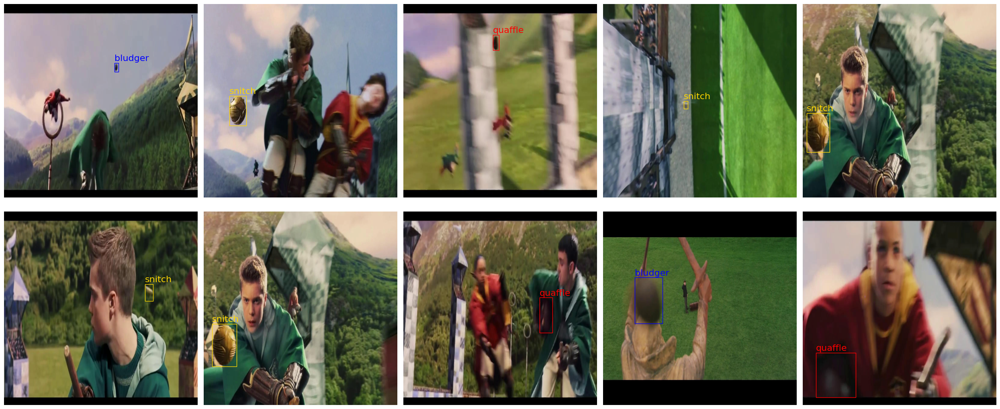

In [46]:
test_loader = torch.utils.data.DataLoader(test_set, batch_size = 10, collate_fn = collate_fn)
images, targets = next(iter(test_loader))
targets = decode_predictions(targets)
visualize(list(zip(images, targets)))

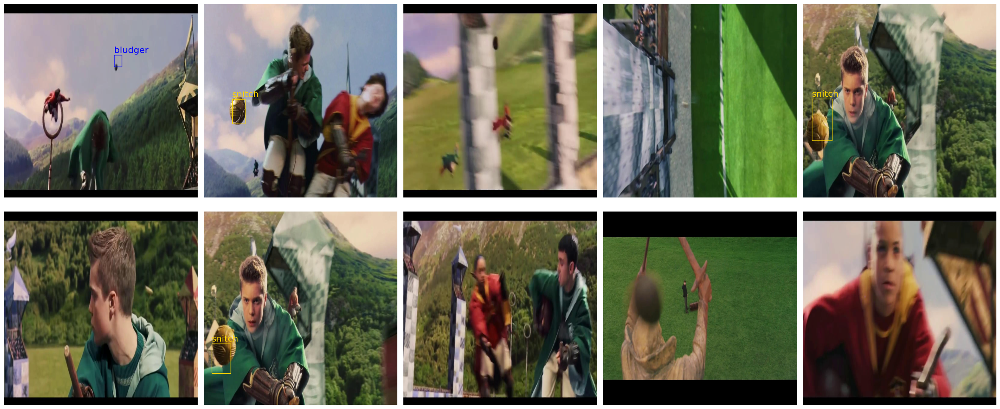

In [47]:
my_model.eval()
output = my_model(images.to(device)).cpu().detach()
predictions = decode_predictions(output, threshold = 0.25)
visualize(list(zip(images, predictions)))

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

## Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO v8 от ultralytics.

In [48]:
! pip install ultralytics

### Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow

In [49]:
shutil.rmtree("{}/train".format(DATASET_NAME), ignore_errors = True)
shutil.rmtree("{}/valid".format(DATASET_NAME), ignore_errors = True)

In [50]:
os.makedirs("{}/train/images".format(DATASET_NAME), exist_ok = True)
os.makedirs("{}/train/labels".format(DATASET_NAME), exist_ok = True)
os.makedirs("{}/valid/images".format(DATASET_NAME), exist_ok = True)
os.makedirs("{}/valid/labels".format(DATASET_NAME), exist_ok = True)

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO v8. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

In [51]:
def annotation2txt(image_width: int, image_height: int, bbox: typing.Tuple[int, int, int, int, int]) -> str:
    xmin, ymin, xmax, ymax, class_idx = bbox

    center_x = (xmin + xmax) / (2 * image_width)
    center_y = (ymin + ymax) / (2 * image_height)

    width = (xmax - xmin) / image_width
    height = (ymax - ymin) / image_height

    return '{} {} {} {} {}'.format(class_idx, center_x, center_y, width, height)


def annotations2txt(bboxes: typing.List[typing.Tuple[int, int, int, int, int]], width: int, height: int) -> typing.Iterable[str]:
    return map(functools.partial(annotation2txt, width, height), bboxes)


def process(dataset: PascalDataset, name: str) -> None:
    for i in tqdm.trange(len(dataset), desc = name):
        path = dataset.images[i]
        image = dataset.get_image(i)
        bboxes = dataset.get_bboxes(i)
        shutil.copyfile(path, "./{}/{}/images/{}".format(DATASET_NAME, name, path.name))
        with open("./{}/{}/labels/{}.txt".format(DATASET_NAME, name, path.stem), "w", encoding = "utf8") as f:
            f.write("\n".join(annotations2txt(bboxes, image.shape[1], image.shape[0])))

process(train_set, "train")
process(test_set, "valid")

valid: 100%|██████████| 29/29 [00:00<00:00, 202.48it/s]


In [52]:
def build_yaml(classes: typing.List[str]) -> None:
    path = "path: ../{}".format(DATASET_NAME)
    train = "train: ./train/images"
    val = "val: ./valid/images"
    nc = "nc: {}".format(len(classes))
    names = "names: {}".format(classes)
    with open("{}/data.yaml".format(DATASET_NAME), "w") as f:
        f.write(f"{path}\n{train}\n{val}\n\n{nc}\n{names}")
build_yaml(list(train_set.class_to_idx.keys()))

### Задание 5.2. 1.5 балла.

Обучите модель YOLO v8 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель нужно взять необученную!

Подсказка: подумайте зачем вам data.yaml и что такое yolov8n.yaml (не стесняйтесь гуглить)

In [53]:
import ultralytics
yolo_model = ultralytics.YOLO('yolov8n.yaml')
yolo_model.train(
    seed = RANDOM_STATE, deterministic = True,
    pretrained = False, data = './{}/data.yaml'.format(DATASET_NAME),
    project = "DL-HW-3", name = '{} - YOLO'.format(DATASET_NAME), exist_ok = True,
    # Jupyter on Windows does not support workers
    workers = 1,
    # Fix for losses being nan: https://github.com/ultralytics/ultralytics/issues/1149,
    # https://github.com/ultralytics/yolov5/issues/6907, https://stackoverflow.com/questions/75178762/i-got-nan-for-all-losses-while-training-yolov8-model
    amp = False
)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

Freezing layer 'model.22.dfl.conv.weight'


train: Scanning D:\HSE\year-3\HSE\Deep-Learning-Intro\HW3\harry\train\labels... 254 images, 0 backgrounds, 0 corrupt: 100%|██████████| 254/254 [00:00<00:00, 1139.07it/s]

train: New cache created: D:\HSE\year-3\HSE\Deep-Learning-Intro\HW3\harry\train\labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning D:\HSE\year-3\HSE\Deep-Learning-Intro\HW3\harry\valid\labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 722.62it/s]

val: New cache created: D:\HSE\year-3\HSE\Deep-Learning-Intro\HW3\harry\valid\labels.cache
Plotting labels to DL-HW-3\harry - YOLO\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 1 dataloader workers
Logging results to DL-HW-3\harry - YOLO
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.66G      4.569      8.166      4.266         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         29         30   6.61e-05     0.0238    3.7e-05    7.4e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.31G      4.679      8.678      4.161         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         29         30   6.64e-05     0.0238   3.57e-05   1.07e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.31G      3.974      7.544      3.948         31        640: 100%|██████████| 16/16 [00:05<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         29         30   0.000371     0.0238   0.000216   4.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.31G      3.551      6.455      3.479         29        640: 100%|██████████| 16/16 [00:05<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all         29         30   0.000371     0.0238   0.000216   4.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.31G       3.32      6.124      3.261         29        640: 100%|██████████| 16/16 [00:05<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         30   0.000371     0.0238   0.000216   4.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.28G      3.385      6.101       3.09         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

                   all         29         30   0.000371     0.0238   0.000216   4.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.31G      3.188      5.648      2.806         32        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         29         30   0.000371     0.0238   0.000216   4.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.31G      3.103      5.315      2.659         26        640: 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         29         30    0.00127      0.167    0.00196   0.000812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.31G      2.998      4.834      2.556         28        640: 100%|██████████| 16/16 [00:05<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         29         30      0.732     0.0238     0.0196    0.00946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.31G      2.886      4.704      2.455         23        640: 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         29         30     0.0661     0.0714     0.0433     0.0162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.31G      2.789      4.414      2.435         28        640: 100%|██████████| 16/16 [00:05<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         30      0.473      0.123     0.0729     0.0273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.31G      2.711      3.916       2.27         30        640: 100%|██████████| 16/16 [00:05<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         29         30      0.524      0.171      0.121     0.0495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.31G      2.616      3.821      2.212         29        640: 100%|██████████| 16/16 [00:05<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         29         30       0.23      0.253      0.181     0.0888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.31G       2.47       3.56      2.083         34        640: 100%|██████████| 16/16 [00:05<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         29         30      0.262      0.282      0.183      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.31G      2.447      3.511      2.102         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         29         30      0.207      0.258      0.141     0.0607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.31G      2.528      3.461      2.064         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         29         30      0.677      0.163      0.191      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.31G      2.372       3.32      2.123         31        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         29         30      0.918       0.18      0.265      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.31G      2.247      3.072      1.856         39        640: 100%|██████████| 16/16 [00:04<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         30      0.956      0.159      0.251      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.31G      2.236      3.163      1.942         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         30       0.36      0.345      0.276      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.31G        2.3      2.921      1.913         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         30      0.256      0.369      0.293      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.31G      2.279      2.782      1.955         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         30      0.765      0.187      0.289       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.31G       2.17      2.768      1.853         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         30      0.482      0.335        0.3      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.31G      2.264      2.828      1.948         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         29         30      0.427      0.258      0.292      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.31G      2.142      2.672      1.772         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         30      0.505      0.365      0.314      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.31G      2.226      2.662       1.81         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         29         30      0.524      0.345      0.346      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.31G      2.098      2.445      1.751         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         30      0.612      0.379      0.397      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.31G      2.046      2.373        1.7         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         30      0.637      0.321       0.41      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.31G       2.03      2.294      1.679         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         29         30        0.5      0.362       0.37      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.31G      1.987        2.3      1.607         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         29         30      0.551      0.435      0.446      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.31G      1.999      2.284      1.695         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         30      0.472      0.404      0.431      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.31G      1.926      2.179      1.625         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         29         30      0.575      0.509       0.45      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.31G      1.986      2.151      1.618         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         30        0.6      0.496      0.509      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.31G      1.977       2.11      1.661         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         29         30      0.587      0.437      0.431      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.31G      1.917      2.086      1.547         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         29         30       0.44      0.413       0.48       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.31G      1.859      2.011      1.585         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         30      0.694      0.445      0.562      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.31G      1.885      2.059      1.611         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         29         30      0.689      0.373      0.505      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.31G      1.858      1.966      1.582         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         29         30      0.827      0.554      0.663      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.31G      1.839      1.969      1.572         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         30      0.847      0.497      0.636      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.31G       1.77      1.826      1.505         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         29         30      0.876      0.508      0.657      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.31G      1.732      1.778      1.475         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         30      0.871       0.56      0.648      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.31G      1.785      1.818      1.476         39        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         30      0.694      0.496      0.663      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.31G      1.778      1.726      1.494         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         30      0.701       0.58      0.654      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.31G      1.777      1.767       1.52         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         30      0.868      0.608        0.7      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.31G      1.721      1.661      1.477         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         29         30      0.886       0.49      0.721      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.31G      1.795      1.781      1.465         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         30      0.639      0.587      0.616       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.31G      1.676      1.701      1.426         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         30       0.77      0.579      0.679      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.31G      1.626      1.671      1.446         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         30      0.797      0.634      0.796      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.31G      1.604      1.606      1.433         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         29         30      0.643      0.766      0.736      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.31G      1.607       1.58      1.436         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         29         30      0.642      0.728      0.734      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.31G      1.627      1.559      1.427         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         30      0.835      0.687      0.813      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.31G       1.57      1.508      1.409         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         30      0.796      0.745        0.8      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.31G      1.626      1.534      1.451         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         29         30      0.787      0.711      0.769      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.31G      1.598      1.523      1.376         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         30      0.672      0.595      0.705      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.31G      1.649      1.533       1.42         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         29         30      0.705      0.615      0.697      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.31G       1.54      1.575      1.354         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         30      0.704      0.651      0.764      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.31G      1.618      1.506      1.427         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         30      0.788      0.714      0.743      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.31G      1.572      1.471      1.394         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         30      0.716      0.745       0.78      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.31G      1.568      1.451      1.339         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         29         30      0.762       0.65        0.7      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.31G      1.585      1.497      1.342         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         30      0.901      0.674      0.849      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.31G       1.58       1.48      1.376         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         30       0.75      0.833      0.864       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.31G      1.552      1.418       1.35         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         29         30      0.838      0.836      0.835      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.31G       1.51      1.338      1.338         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         29         30      0.784      0.774      0.794      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.31G      1.487      1.295      1.308         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         29         30       0.74       0.77      0.808      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.31G      1.536      1.311       1.33         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         29         30      0.757      0.815      0.835       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.31G      1.453      1.272      1.292         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         29         30      0.852      0.793      0.884      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.31G      1.443      1.228      1.298         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         29         30      0.813       0.77      0.829      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.31G      1.536       1.35      1.367         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         30      0.743      0.839      0.832      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.31G      1.401      1.198      1.319         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         29         30      0.781      0.819      0.825      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.31G      1.496      1.296      1.294         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         30      0.677      0.797      0.805      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.31G      1.441      1.267      1.309         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         30       0.79      0.757      0.818      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.31G      1.496      1.307      1.307         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         29         30      0.855      0.887      0.882      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.31G      1.452      1.257      1.302         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         29         30      0.888      0.819      0.872      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.31G      1.417      1.252      1.303         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         29         30      0.725      0.893      0.838      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.31G      1.419      1.173      1.307         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         30       0.85      0.793      0.822      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.31G      1.397      1.201      1.287         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         29         30      0.812      0.877       0.85      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.31G      1.356      1.096      1.247         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         30      0.828      0.879      0.894      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.31G      1.431      1.214      1.286         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         30      0.862      0.853      0.866      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.31G      1.407      1.157      1.252         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         30      0.809      0.883      0.862      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.31G       1.38       1.14      1.245         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         30      0.743      0.854      0.838      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.31G      1.421      1.159      1.278         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         29         30      0.756      0.817      0.812      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.31G      1.352      1.116      1.297         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         30      0.797      0.873      0.855      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.31G      1.283      1.092      1.236         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         30      0.806      0.753       0.83      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.31G      1.399      1.165      1.268         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         29         30      0.762      0.884      0.847      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.31G      1.332      1.124      1.231         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all         29         30      0.805      0.864      0.887      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.31G       1.34      1.149      1.217         30        640: 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         29         30      0.889      0.838      0.884       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.31G      1.379      1.104      1.232         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         29         30      0.893      0.806      0.881       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.31G      1.327      1.092      1.235         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         30      0.932      0.771      0.881      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.31G      1.379      1.126        1.2         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         30      0.854      0.861      0.899      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.31G       1.34      1.096      1.241         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         30      0.896      0.871      0.897       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.31G      1.308      1.085       1.21         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         29         30      0.855      0.874      0.896      0.615


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.31G       1.33      1.234      1.251         14        640: 100%|██████████| 16/16 [00:04<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         30      0.746      0.849      0.847      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.31G      1.344       1.13       1.26         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         29         30      0.783      0.656      0.829      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.31G       1.25      1.124      1.227         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         29         30       0.83       0.69      0.839      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.31G      1.284      1.085      1.219         14        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         30      0.819      0.822      0.843      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.31G      1.313      1.074      1.247         17        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         30      0.818      0.829      0.839       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.31G      1.289       1.11      1.251         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         29         30      0.836      0.794       0.88      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.31G      1.273      1.043        1.2         18        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         30      0.824      0.869      0.883      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.31G      1.227      1.042      1.183         17        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         30      0.821       0.75      0.869      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.31G      1.181      1.027      1.193         13        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         30       0.72      0.813       0.87        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.31G      1.244      1.014      1.197         14        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         30      0.788      0.867      0.875      0.598



100 epochs completed in 0.145 hours.
Optimizer stripped from DL-HW-3\harry - YOLO\weights\last.pt, 6.3MB
Optimizer stripped from DL-HW-3\harry - YOLO\weights\best.pt, 6.3MB

Validating DL-HW-3\harry - YOLO\weights\best.pt...
Ultralytics YOLOv8.0.220 🚀 Python-3.10.11 torch-2.1.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLOv8n summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


                   all         29         30      0.855      0.874      0.896      0.618
                snitch         29         12          1      0.837      0.917      0.543
               quaffle         29         14      0.775      0.786      0.876      0.558
               bludger         29          4       0.79          1      0.895      0.753
Speed: 0.1ms preprocess, 7.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to DL-HW-3\harry - YOLO


lr/pg0,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▁▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▇▆▇▇▆▇███▇▇█▇██▇███▇███
metrics/mAP50-95(B),▁▁▁▁▁▂▂▂▃▃▄▃▄▄▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇███▇███
metrics/precision(B),▁▁▁▁▄▃▆█▇▄▅▅▅▄▆▇▆▇▇▆▇▆▇█▇▇▆▆█▇▇▆▇▇██▇▇▇▇
metrics/recall(B),▁▁▁▂▂▃▂▂▂▃▄▄▅▄▄▅▅▅▆▇▇▆▇▆███▇█▇██▇█▇█▆███
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016B39BC5E10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          

### Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.


0: 640x640 1 bludger, 1: 640x640 1 snitch, 2: 640x640 1 quaffle, 3: 640x640 (no detections), 4: 640x640 1 snitch, 5: 640x640 1 snitch, 6: 640x640 1 snitch, 7: 640x640 1 quaffle, 8: 640x640 1 bludger, 40.0ms
Speed: 1.9ms preprocess, 4.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


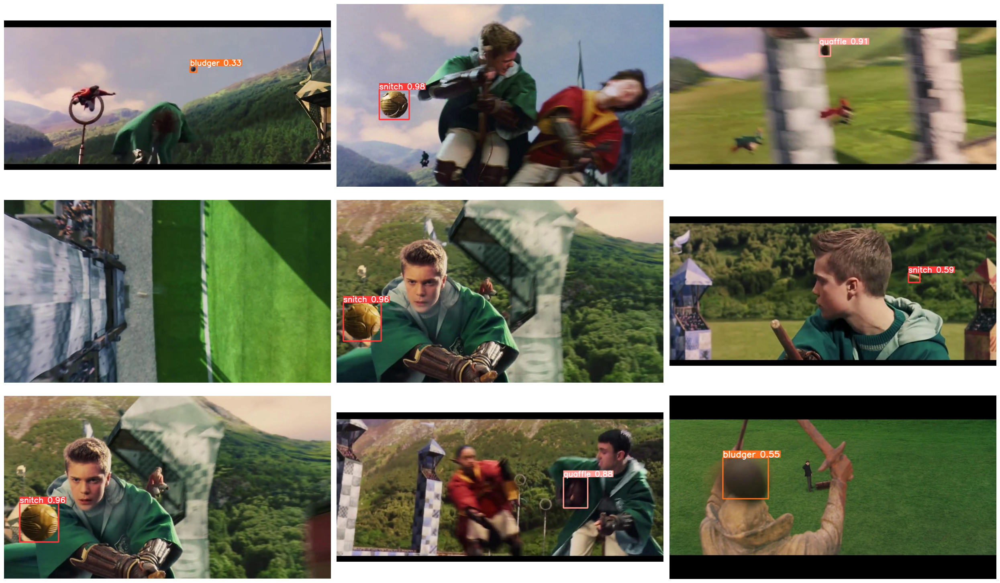

In [54]:
def visualize_ultralytics(test_set: PascalDataset, rows: int, cols: int) -> None:
    fig, axes = matplotlib.pyplot.subplots(rows, cols, figsize = (25, 15), dpi = 100)
    predictions = yolo_model.predict(test_set.images[0 : rows * cols])
    for ax, prediction in zip(axes.reshape(-1), predictions):
        ax.axis(False)
        # https://docs.ultralytics.com/modes/predict/#plotting-results
        ax.imshow(PIL.Image.fromarray(prediction.plot()[..., ::-1]))
    fig.tight_layout()
visualize_ultralytics(test_set, 3, 3)